In [1]:
import geopandas as gpd
import pandas as pd
import geobr
import matplotlib.pyplot as plt
import numpy as np
from shapely.wkt import loads as load_wkt
from shapely.geometry import Point
import matplotlib.lines as mlines

In [2]:
#Leitura dos dados utilizados
df_geobr = geobr.read_municipality(code_muni='all', year=2018)
df_estados = geobr.read_state(code_state='all', year=2018)

In [3]:
#Pegando apenas as colunas que correspondem ao código e o shape do município
colunas = ['code_muni', 'geometry']
df_geobr = df_geobr[colunas]
df_geobr

,code_muni,geometry
0,1100015.0,"MULTIPOLYGON (((-62.23224 -11.90804, -62.20670..."
1,1100023.0,"MULTIPOLYGON (((-63.57327 -9.78326, -63.57016 ..."
2,1100031.0,"MULTIPOLYGON (((-60.71834 -13.39058, -60.70904..."
3,1100049.0,"MULTIPOLYGON (((-61.27873 -11.50596, -61.28097..."
4,1100056.0,"MULTIPOLYGON (((-61.41347 -13.23417, -61.42603..."
...,...,...
5567,5222005.0,"POLYGON ((-48.53842 -16.75003, -48.54051 -16.7..."
5568,5222054.0,"POLYGON ((-50.00189 -17.78179, -50.01420 -17.7..."
5569,5222203.0,"POLYGON ((-47.07742 -15.06330, -47.07851 -15.0..."
5570,5222302.0,"POLYGON ((-48.91463 -15.20939, -48.91532 -15.1..."


In [4]:
#Retirando valores nulos
df_geobr = df_geobr.dropna()
df_geobr

,code_muni,geometry
0,1100015.0,"MULTIPOLYGON (((-62.23224 -11.90804, -62.20670..."
1,1100023.0,"MULTIPOLYGON (((-63.57327 -9.78326, -63.57016 ..."
2,1100031.0,"MULTIPOLYGON (((-60.71834 -13.39058, -60.70904..."
3,1100049.0,"MULTIPOLYGON (((-61.27873 -11.50596, -61.28097..."
4,1100056.0,"MULTIPOLYGON (((-61.41347 -13.23417, -61.42603..."
...,...,...
5567,5222005.0,"POLYGON ((-48.53842 -16.75003, -48.54051 -16.7..."
5568,5222054.0,"POLYGON ((-50.00189 -17.78179, -50.01420 -17.7..."
5569,5222203.0,"POLYGON ((-47.07742 -15.06330, -47.07851 -15.0..."
5570,5222302.0,"POLYGON ((-48.91463 -15.20939, -48.91532 -15.1..."


In [5]:
centroides = []
for linha in df_geobr.itertuples():
    poligono = load_wkt(str(linha.geometry))
    centroides.append(poligono.centroid)

In [6]:
df_centroides = pd.DataFrame()
df_centroides['geometry'] = centroides
df_centroides = gpd.GeoDataFrame(df_centroides)
df_centroides.crs = df_geobr.crs

In [7]:
centroides_estado = []
for linha in df_estados.itertuples():
    poligono = load_wkt(str(linha.geometry))
    centroides_estado.append(poligono.centroid)
    
coordenadas_estado = []
for point in centroides_estado:
    coordenadas_estado.append((point.x, point.y))
    
df_estados['centroides'] = coordenadas_estado

C:\Users\Gabreil\Anaconda3\envs\CDA\lib\site-packages\matplotlib\collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


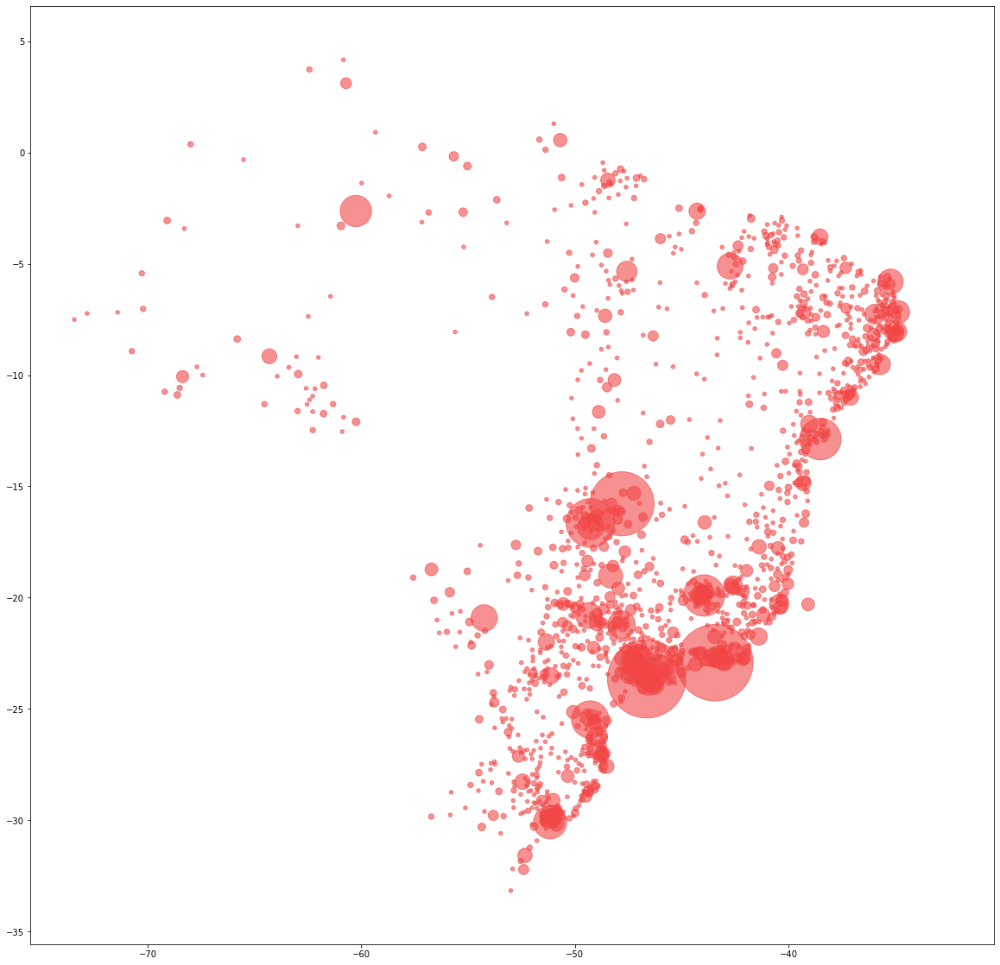

In [8]:
arquivo = "semana34.csv"
df_casos = pd.read_csv(arquivo)
copy_geobr = df_geobr.copy()
copy_geobr = pd.merge(copy_geobr, df_casos, on='code_muni', how='left')
copy_geobr.fillna(0, inplace=True)

markersize = []
for linha in copy_geobr.itertuples():
    markersize.append(linha.mortes*20)

fig, ax = plt.subplots(figsize=(20, 20))

xs=[point.x for point in df_centroides['geometry']]
ys=[point.y for point in df_centroides['geometry']]
scatter = ax.scatter(xs, ys, markersize, alpha=0.6, color="#f24646")

del df_casos

handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6, color='#f24646', num=7)
labels[0]  = "100"
labels[1]  = "150"
labels[2]  = "200"
labels[3]  = "250"
labels[4]  = "300"
labels[5]  = "350"
labels[6]  = "400"
labels[7]  = "450"

<ipython-input-9-354d7d12599a>:24: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=linha.abbrev_state, xy=linha.centroides, horizontalalignment='center', verticalalignment='center', fontsize=20)
<ipython-input-9-354d7d12599a>:24: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=linha.abbrev_state, xy=linha.centroides, horizontalalignment='center', verticalalignment='center', fontsize=20)
<ipython-input-9-354d7d12599a>:24: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=linha.abbrev_state, xy=linha.centroides, horizontalalignment='center', verticalalignment='cente

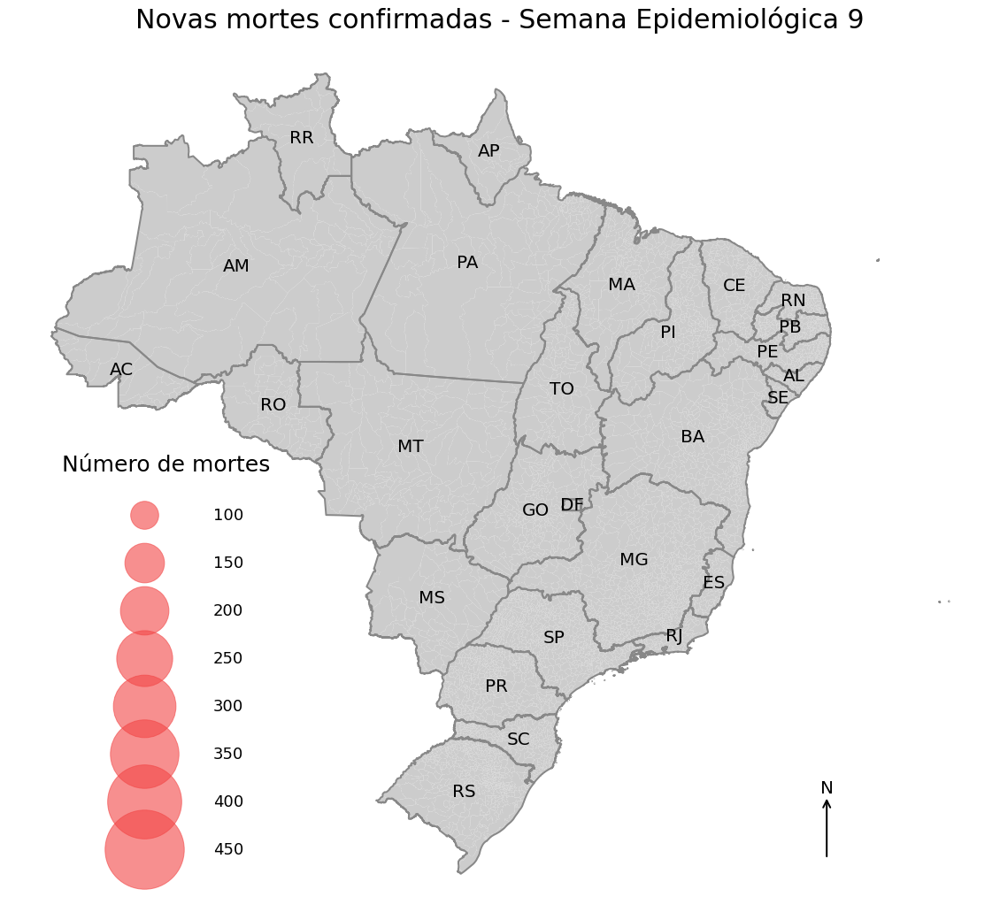

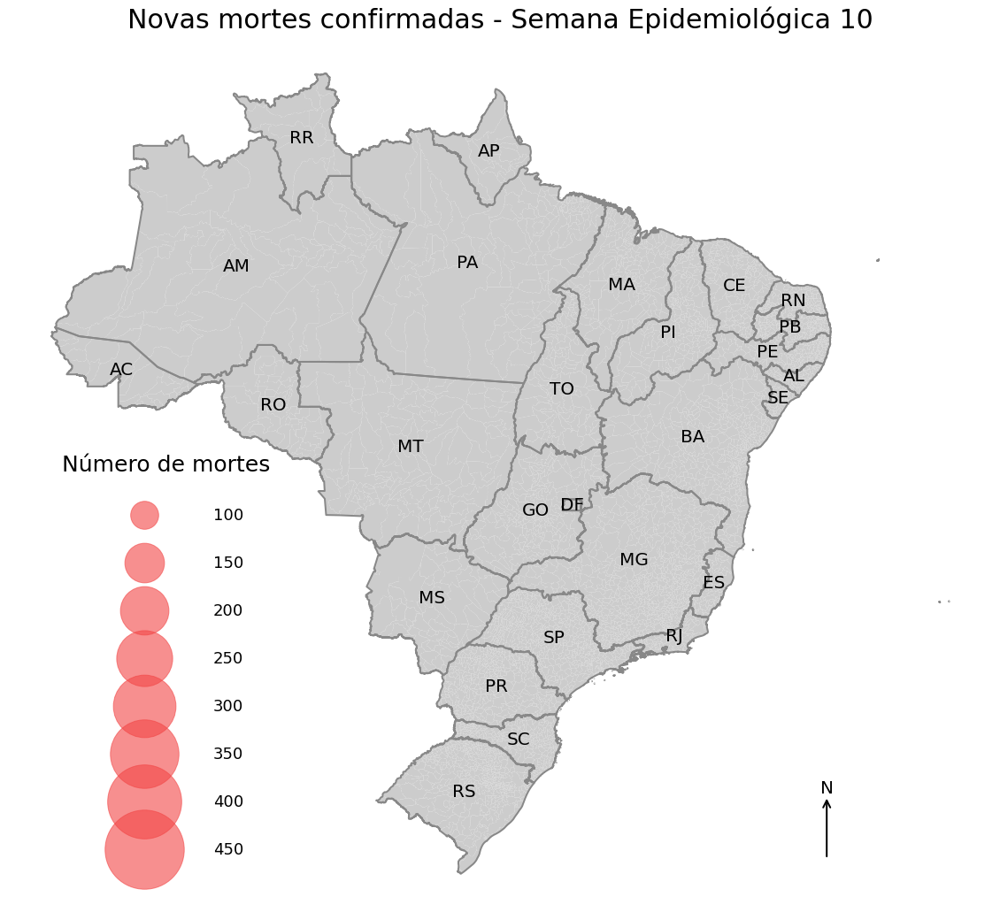

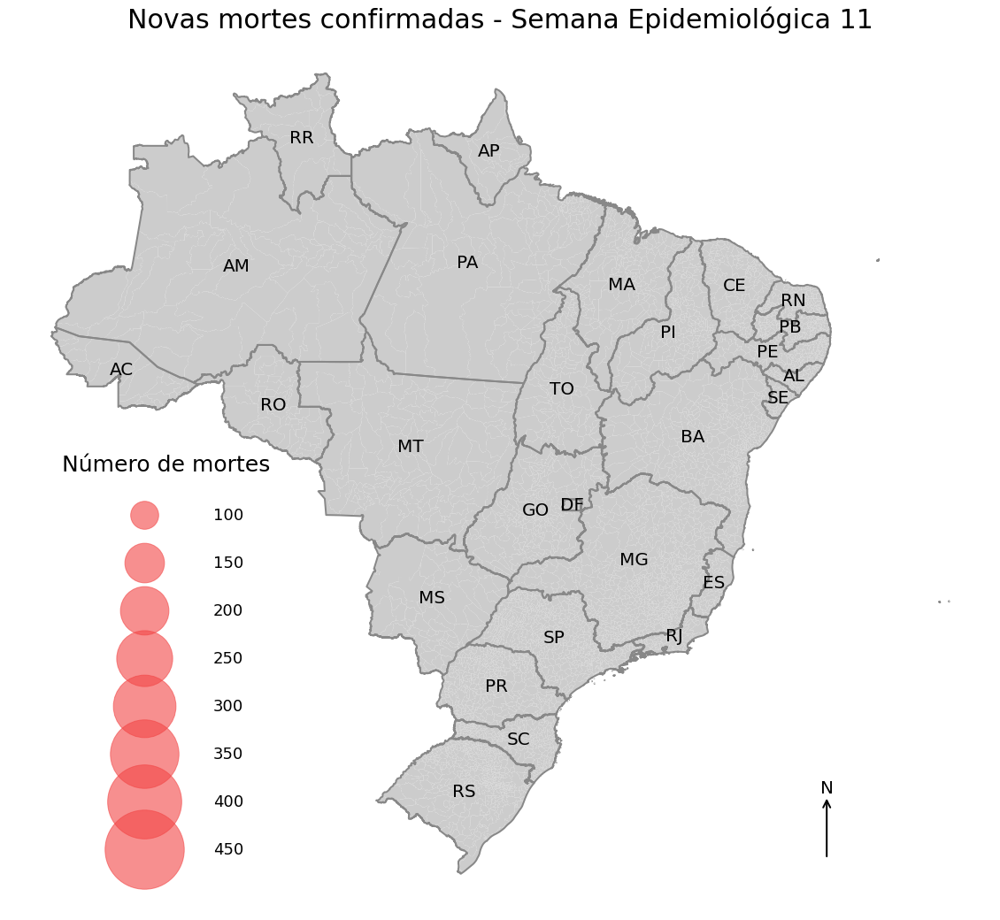

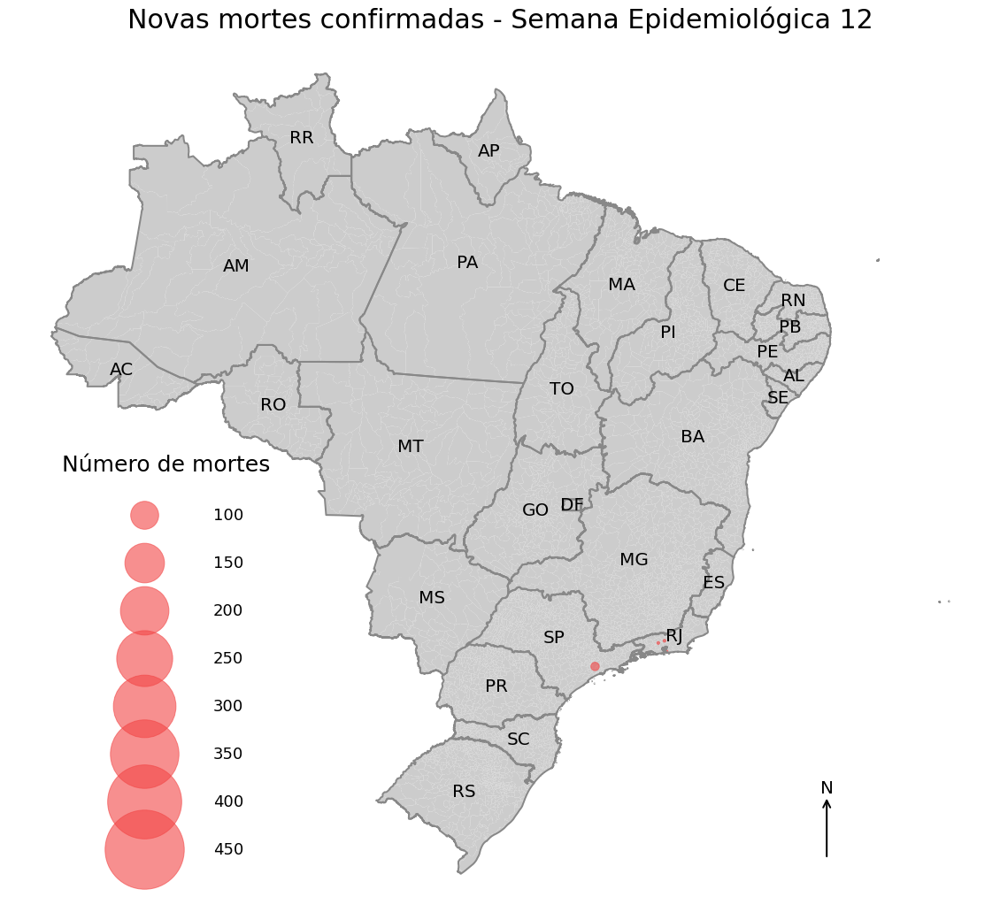

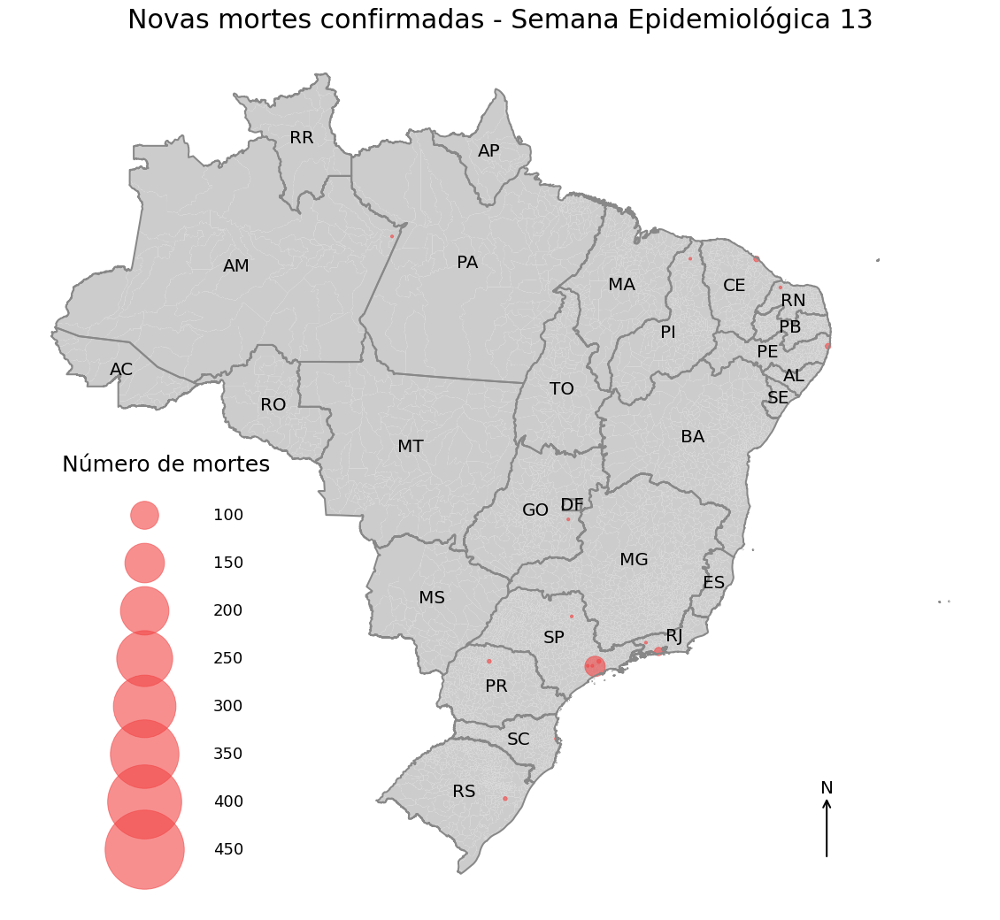

...

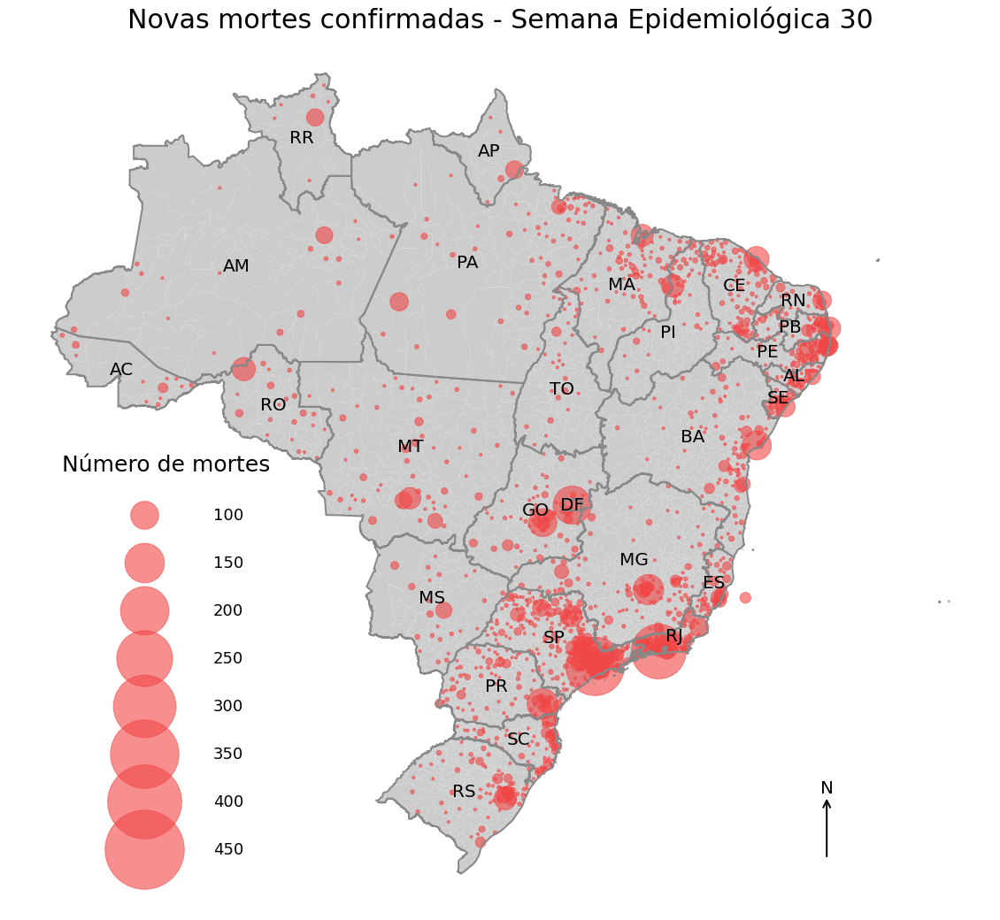

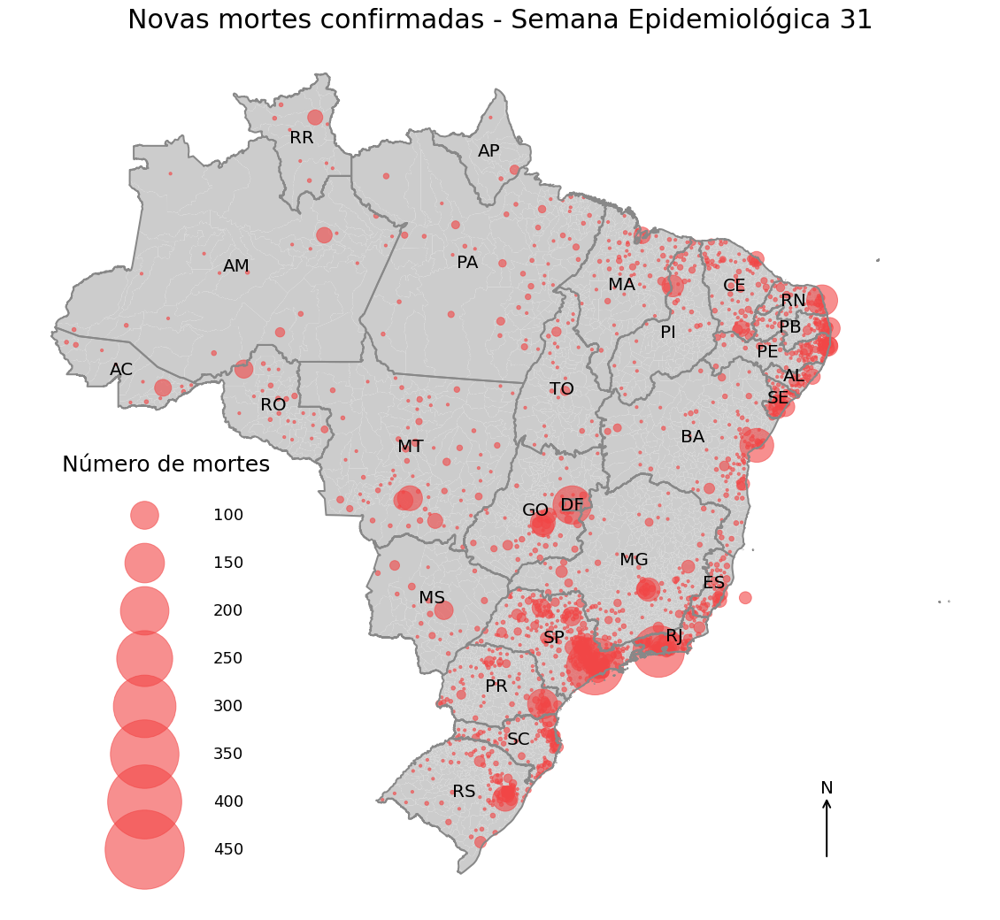

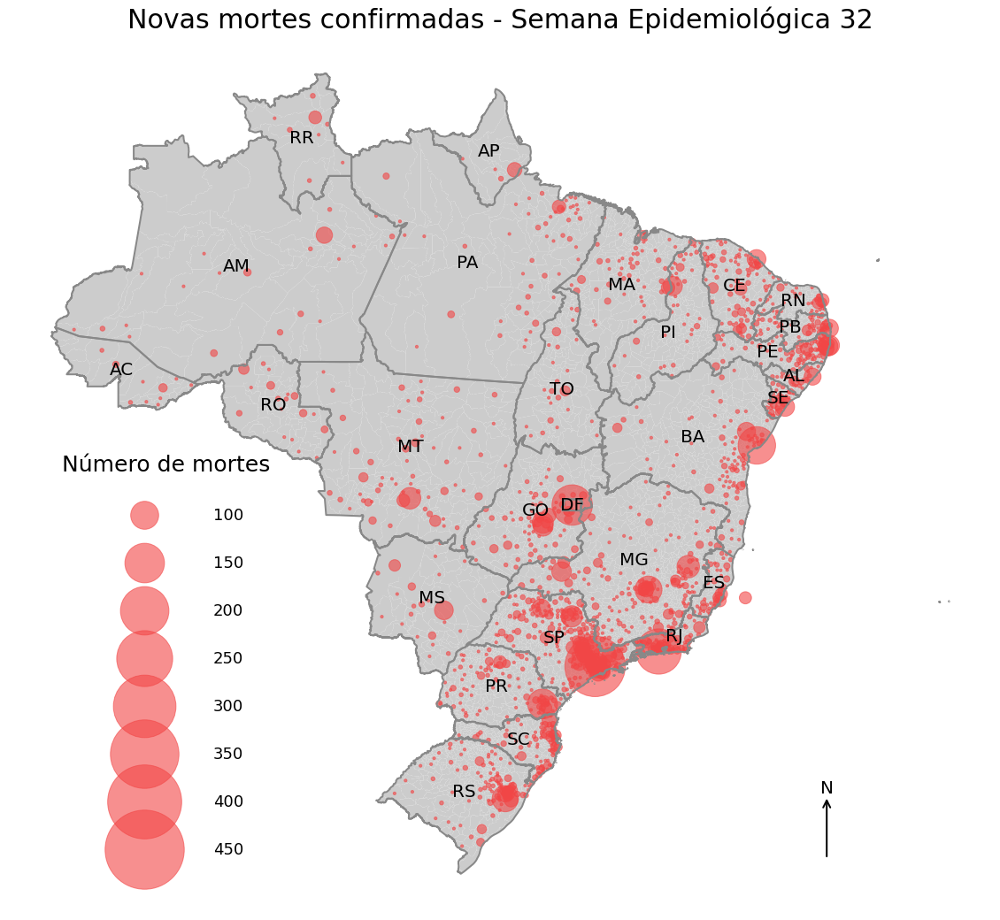

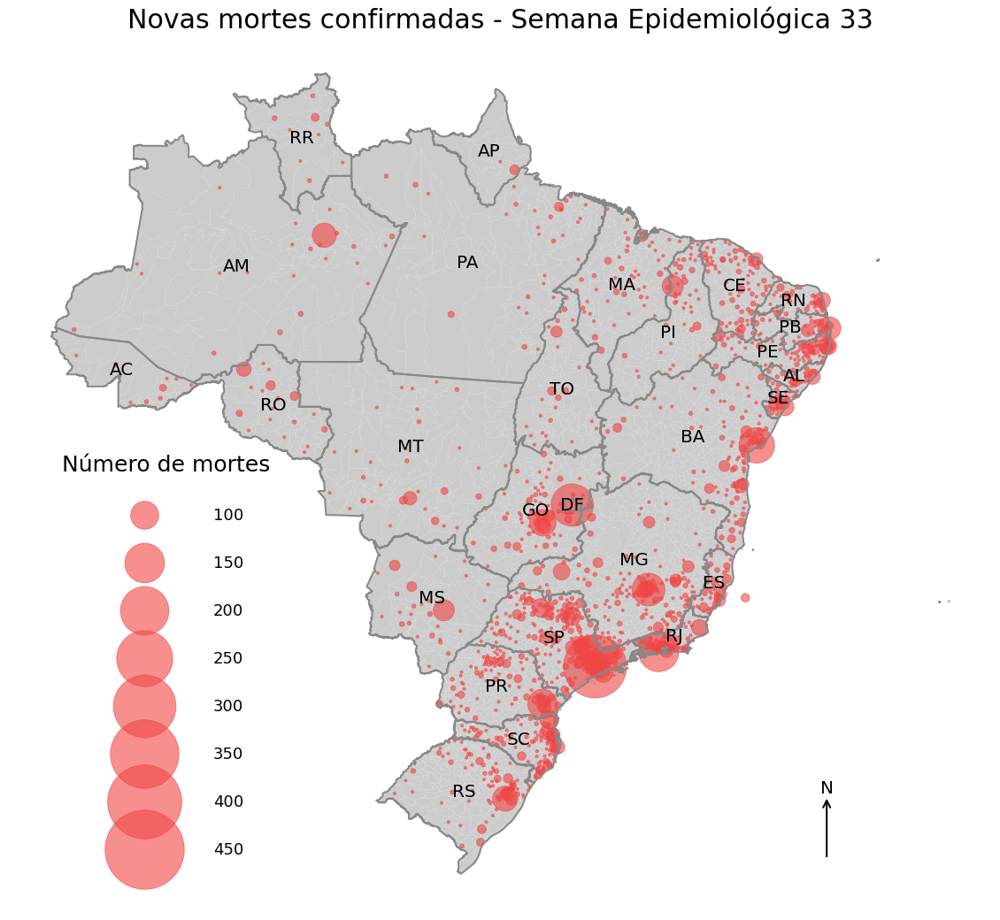

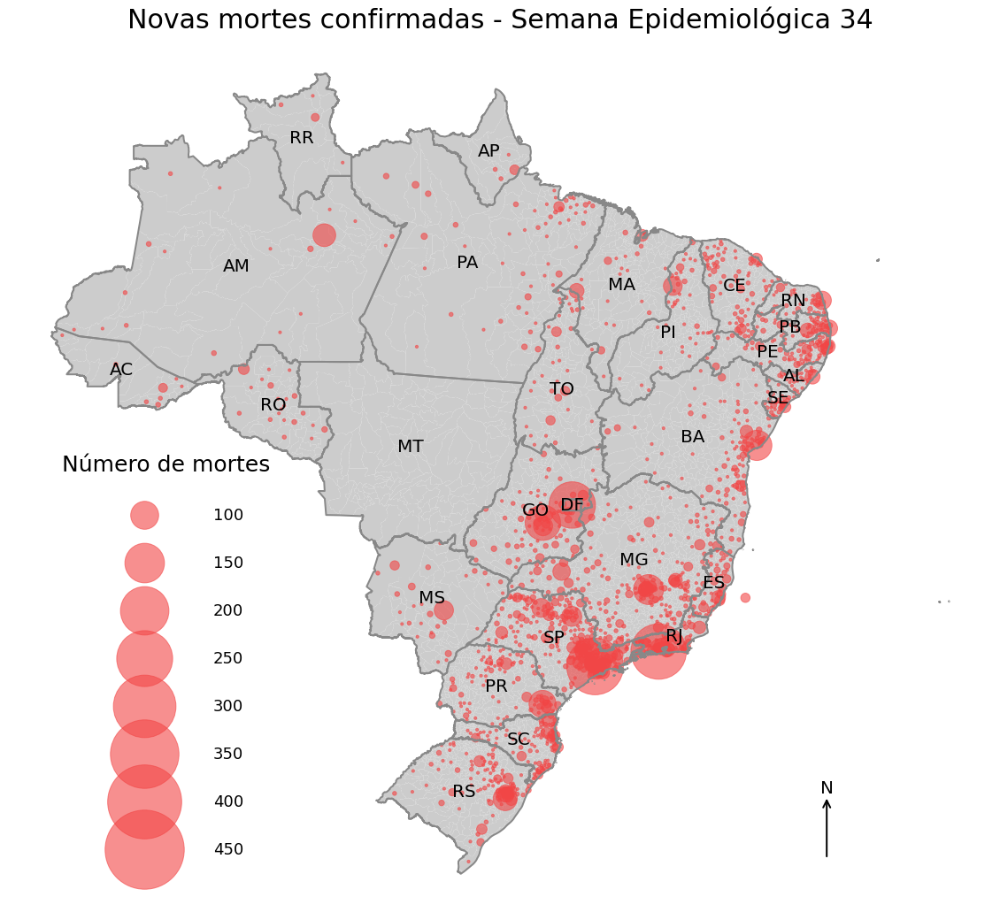

In [9]:
legend ='''ax.legend(handles, labels, title="Número de mortes", loc=3,borderpad=3, labelspacing=2, handlelength=7, title_fontsize=25, fontsize=18, frameon=False)'''
for semana in range(9,35):
    arquivo = "semana{}.csv".format(semana)
    df_casos = pd.read_csv(arquivo)
    copy_geobr = df_geobr.copy()
    copy_geobr = pd.merge(copy_geobr, df_casos, on='code_muni', how='left')
    copy_geobr.fillna(0, inplace=True)
    
    markersize = []
    for linha in copy_geobr.itertuples():
        markersize.append(linha.mortes*10)
        
    fig, ax = plt.subplots(figsize=(20, 20))
    copy_geobr.plot(ax=ax, facecolor='#cccccc')
    df_estados.geometry.boundary.plot(color=None,edgecolor='#888888',linewidth = 2,ax=ax)

    ax.scatter(xs, ys, markersize, alpha=0.6, color="#f24646")
    
    ax.annotate('', xy=(-35, -30), xytext=(-35, -33), arrowprops=dict(arrowstyle= '->', color='k', lw=2, mutation_scale=20))
    ax.text(-35, -30, "N", ha="center", va="bottom", size=20)
    ax.axis('off')
    
    for linha in df_estados.itertuples():
        plt.annotate(s=linha.abbrev_state, xy=linha.centroides, horizontalalignment='center', verticalalignment='center', fontsize=20)

    exec(legend)
    plt.title("Novas mortes confirmadas - Semana Epidemiológica {}".format(semana), fontsize=30)
    plt.savefig("mapa_mortes_{}.png".format(semana))
    del df_casos